# Data for GOOD

**Dans ce challenge, ouvert à tous, vous allez réaliser une analyse exploratoire avec un jeu de données portant sur les arbres de la ville de Paris, dans le cadre du programme "Végétalisons la ville".
Votre solution contribuera à une optimisation des tournées pour l’entretien des arbres de la ville.**

1. Les données doivent être explorées à l’aide de Python et de ses librairies. 
Vous soumettrez votre analyse sous forme de présentation, contenant les informations suivantes : <br>
 _ Présentation générale du jeu de données <br>
 _ Démarche méthodologique d’analyse de données <br>
 _ Synthèse de l’analyse de données
2. Le second livrable prendra la forme d’un Notebook Jupyter. Le Notebook sera documenté pour expliciter les différents traitements, calculs ou graphiques que vous effectuez en utilisant les fonctionnalités d’édition de texte de Jupyter. Vos explications doivent permettre à un public non technique de comprendre les différentes étapes de votre analyse et votre synthèse.
3. Le troisième livrable ( optionnel mais permettra de se différencier des autres participants) prendra la forme d’un dashboard PowerBI avec au moins 4 visualisations 

Vous travaillez en binôme et vous avez 20 min pour présenter votre solution

## 1. Importation des librairies et Chargement des données

In [1]:
# import des librairies
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly as py
import plotly.express as px
import plotly.graph_objects as go

In [2]:
# Récupération des données dans un dataframe (~tableur)
data_trees = pd.read_csv("C:/Users/Lenovo/Documents/IA School/IA School 2/Data4good/data_trees.csv", sep =";")

## 2. Exploration des données 

Cette première partie est destinée à faire une "prise en main" du jeu de données. Elle est nécessaire pour se faire une idée générale du jeu de données qu'on s'apprête à étudier. On récolte les premières informations comme la taille du dataset, le nombre de lignes et colonnes qui le composent, les différentes caractéristiques étudiées, le nombre de valeurs NaN. 

In [137]:
# Extraire les informations principales du dataset (noms des colonnes,nb de colonnes, nb de valeurs non-nulles par colonne,
# type de variables,...)
print(data_trees.info())

# Compter le nombre de NAN par colonne
print('\nNombre de valeurs NAN par colonne:\n',data_trees.isna().sum())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200137 entries, 0 to 200136
Data columns (total 18 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   id                   200137 non-null  int64  
 1   type_emplacement     200137 non-null  object 
 2   domanialite          200136 non-null  object 
 3   arrondissement       200137 non-null  object 
 4   complement_addresse  30902 non-null   object 
 5   numero               0 non-null       float64
 6   lieu                 200137 non-null  object 
 7   id_emplacement       200137 non-null  object 
 8   libelle_francais     198640 non-null  object 
 9   genre                200121 non-null  object 
 10  espece               198385 non-null  object 
 11  variete              36777 non-null   object 
 12  circonference_cm     200137 non-null  int64  
 13  hauteur_m            200137 non-null  int64  
 14  stade_developpement  132932 non-null  object 
 15  remarquable      

**Définition des variables:**
* Stade_développement: J: Jeune, JA: Jeune Adulte, A: Adulte, M: Mature

In [139]:
# Affiche les premières lignes du dataframe 
data_trees.head()

,id,type_emplacement,domanialite,arrondissement,complement_addresse,numero,lieu,id_emplacement,libelle_francais,genre,espece,variete,circonference_cm,hauteur_m,stade_developpement,remarquable,geo_point_2d_a,geo_point_2d_b
0,99874,Arbre,Jardin,PARIS 7E ARRDT,NaN,NaN,MAIRIE DU 7E 116 RUE DE GRENELLE PARIS 7E,19,Marronnier,Aesculus,hippocastanum,NaN,20,5,NaN,0.0,48.857620,2.320962
1,99875,Arbre,Jardin,PARIS 7E ARRDT,NaN,NaN,MAIRIE DU 7E 116 RUE DE GRENELLE PARIS 7E,20,If,Taxus,baccata,NaN,65,8,A,NaN,48.857656,2.321031
2,99876,Arbre,Jardin,PARIS 7E ARRDT,NaN,NaN,MAIRIE DU 7E 116 RUE DE GRENELLE PARIS 7E,21,If,Taxus,baccata,NaN,90,10,A,NaN,48.857705,2.321061
3,99877,Arbre,Jardin,PARIS 7E ARRDT,NaN,NaN,MAIRIE DU 7E 116 RUE DE GRENELLE PARIS 7E,22,Erable,Acer,negundo,NaN,60,8,A,NaN,48.857722,2.321006
4,99878,Arbre,Jardin,PARIS 17E ARRDT,NaN,NaN,PARC CLICHY-BATIGNOLLES-MARTIN LUTHER KING,000G0037,Arbre à miel,Tetradium,daniellii,NaN,38,0,NaN,NaN,48.890435,2.315289


In [143]:
# Compter le nombre de catégories (pour les caractéristiques de type catégorielles) repertoriés dans le dataset dans l'
# ordre de décroissant
from collections import Counter
 
unique, count = np.unique(data_trees.genre.dropna(), return_counts=True)
pd.DataFrame(count, unique, columns=dict(count=count)).sort_values(by='count', ascending=False)

def countbycat(col):
    unique, countby = np.unique(data_trees[col].dropna(), return_counts=True)
    df = pd.DataFrame(countby, unique, columns=dict(Nb_arbres=countby)).sort_values(by='Nb_arbres', ascending=False)
    return df

countbycat('genre')
countbycat('domanialite')
countbycat('arrondissement')
countbycat('stade_developpement')

,Nb_arbres
A,64438
JA,35444
J,26937
M,6113


In [150]:
genre_tot = len(data_trees.genre.dropna())
esp_tot = len(data_trees.espece.dropna())
var_tot = len(data_trees.variete.dropna())
lib_tot = len(data_trees.libelle_francais.dropna())

lib_tot

198640

## 3. Distribution des données numériques 

hypothèse: dans certains "domaines" les arbres doivent respecter une certaine dimension => confirmation par CM?

In [152]:
data_trees[['circonference_cm','hauteur_m']].describe()

,circonference_cm,hauteur_m
count,200137.000000,200137.000000
mean,83.380479,13.110509
std,673.190213,1971.217387
min,0.000000,0.000000
25%,30.000000,5.000000
50%,70.000000,8.000000
75%,115.000000,12.000000
max,250255.000000,881818.000000


<AxesSubplot:xlabel='circonference_cm', ylabel='domanialite'>

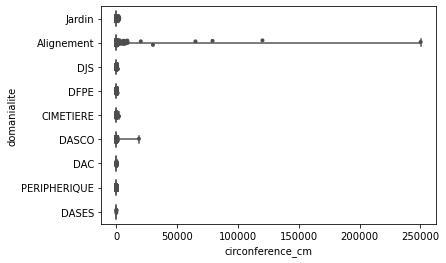

In [7]:
sns.boxplot(x="circonference_cm", y="domanialite", data=data_trees,
            whis=[0, 100], width=.6, palette="vlag")
sns.stripplot(x="circonference_cm", y="domanialite", data=data_trees,
              size=4, color=".3", linewidth=0)

<AxesSubplot:xlabel='circonference_cm', ylabel='domanialite'>

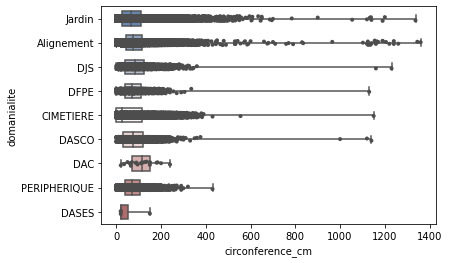

In [8]:
sns.boxplot(x="circonference_cm", y="domanialite", data=data_trees.query('circonference_cm < 1400'),
            whis=[0, 100], width=.6, palette="vlag")
sns.stripplot(x="circonference_cm", y="domanialite", data=data_trees.query('circonference_cm < 1400'),
              size=4, color=".3", linewidth=0)

<AxesSubplot:xlabel='hauteur_m', ylabel='domanialite'>

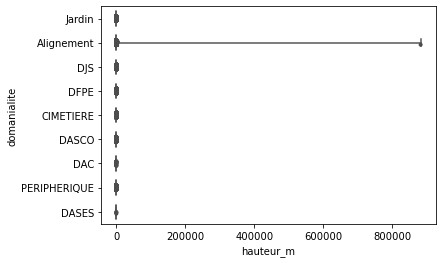

In [9]:
sns.boxplot(x="hauteur_m", y="domanialite", data=data_trees,
            whis=[0, 100], width=.6, palette="vlag")
sns.stripplot(x="hauteur_m", y="domanialite", data=data_trees,
              size=4, color=".3", linewidth=0)

<AxesSubplot:xlabel='hauteur_m', ylabel='domanialite'>

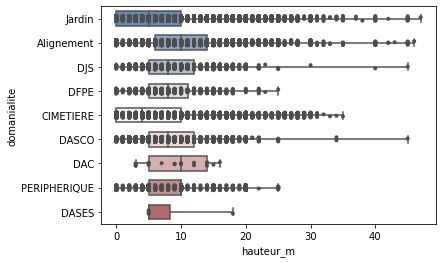

In [10]:
sns.boxplot(x="hauteur_m", y="domanialite", data=data_trees.query('hauteur_m < 50'),
            whis=[0, 100], width=.6, palette="vlag")
sns.stripplot(x="hauteur_m", y="domanialite", data=data_trees.query('hauteur_m < 50'),
              size=4, color=".3", linewidth=0)

In [155]:
print('Pourcentage de données restantes:','{} %'.format(len(data_trees.query('hauteur_m < 50'))*100/len(data_trees)))
print('Nombre total de données:', len(data_trees))
print('Nombre de données restantes après masque:', len(data_trees.query('hauteur_m < 50')))

Pourcentage de données restantes: 99.77115675762103 %
Nombre total de données: 200137
Nombre de données restantes après masque: 199679


In [12]:
data_trees[data_trees['hauteur_m']>100]

,id,type_emplacement,domanialite,arrondissement,complement_addresse,numero,lieu,id_emplacement,libelle_francais,genre,espece,variete,circonference_cm,hauteur_m,stade_developpement,remarquable,geo_point_2d_a,geo_point_2d_b
5392,106800,Arbre,Jardin,PARIS 7E ARRDT,NaN,NaN,JARDIN DU CHAMP DE MARS,A0120683,Tilleul,Tilia,n. sp.,NaN,100,1510,A,0.0,48.855044,2.301780
6473,107951,Arbre,Jardin,PARIS 7E ARRDT,NaN,NaN,JARDIN DU CHAMP DE MARS / C01 / ALLEE LEON BOU...,A00202003,Platane,Platanus,x hispanica,NaN,112,117,A,0.0,48.857536,2.292107
12536,115062,Arbre,Jardin,PARIS 16E ARRDT,11 à 27,NaN,JARDIN DE L AVENUE FOCH / 10 AVENUE FOCH,10303,Erable,Acer,n. sp.,NaN,47,255,J,0.0,48.872669,2.288108
15373,118412,Arbre,Jardin,PARIS 7E ARRDT,NaN,NaN,SQUARE DE L'ABBE ESQUERRE,17,Paulownia,Paulownia,tomentosa,NaN,145,810,A,0.0,48.850550,2.314238
24099,128185,Arbre,Jardin,PARIS 17E ARRDT,NaN,NaN,SQUARE ANDRE ULMANN,27,Platane,Platanus,x hispanica,NaN,130,125,A,0.0,48.889568,2.299114
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
189053,2011417,Arbre,Jardin,BOIS DE VINCENNES,NaN,NaN,PARC FLORAL DE PARIS / ROUTE DE LA PYRAMIDE,180088,Pin,Pinus,mugo,NaN,60,150,JA,0.0,48.834825,2.444247
189441,2011863,Arbre,DFPE,PARIS 16E ARRDT,NaN,NaN,ERLANGER (9-11) CRECHE,48970005,Marronnier,Aesculus,hippocastanum,Baumannii',8,157,NaN,0.0,48.847275,2.261909
189518,2011961,Arbre,Alignement,BOIS DE BOULOGNE,NaN,NaN,AVENUE DE L HIPPODROME,101034,Platane,Platanus,x hispanica,NaN,67,105,JA,0.0,48.858043,2.252875
197136,2020792,Arbre,Jardin,PARIS 14E ARRDT,NaN,NaN,SQUARE AUGUSTE RENOIR / 205 RUE RAYMOND LOSSERAND,103005,Erable,Acer,platanoides,NaN,145,125,A,0.0,48.828272,2.308858


Beaucoup de valeurs abberrantes pour la hauteur des arbres => (!Attention, après recherche l'arbre le plus grand au monde mesure 115m et n'est à priori pas localisé en France). **Il est fort probable que les données soient affectées par un problème de conversion!** 
=> Gestion des outliers dans les analyses futures

In [159]:
print(data_trees.groupby('domanialite')['hauteur_m'].describe())
data_trees.groupby('domanialite')['hauteur_m'].count().boxplot() 

                 count       mean          std  min  25%   50%    75%  \
domanialite                                                             
Alignement    104949.0  18.903620  2722.105973  0.0  6.0  10.0  14.00   
CIMETIERE      31926.0   5.943714     7.860781  0.0  0.0   4.0  10.00   
DAC               21.0   9.380952     4.598654  3.0  5.0  10.0  14.00   
DASCO           6422.0   8.636718    16.056101  0.0  5.0   8.0  12.00   
DASES              4.0   8.250000     6.500000  5.0  5.0   5.0   8.25   
DFPE            1325.0   8.319245     6.944425  0.0  5.0   8.0  11.00   
DJS             3900.0  12.978205    17.368781  0.0  5.0   8.0  13.00   
Jardin         46262.0   6.216765    10.723385  0.0  0.0   5.0  10.00   
PERIPHERIQUE    5327.0   8.501220     5.231475  0.0  5.0  10.0  10.00   

                   max  
domanialite             
Alignement    881818.0  
CIMETIERE        510.0  
DAC               16.0  
DASCO           1211.0  
DASES             18.0  
DFPE             157.

AttributeError: 'Series' object has no attribute 'boxplot'

In [14]:
print(data_trees.groupby('libelle_francais').size().nlargest(10))
print('')
print(data_trees.groupby('genre').size().nlargest(10))
print('')
print(data_trees.groupby('espece').size().nlargest(10))


# data_trees['genre']== [x for x in data_trees.groupby('genre').size().nlargest(10).index]
# data_trees.groupby('espece').size().nlargest(10).index
# data_trees[data_trees['libelle_francais']=='Abelia']

libelle_francais
Platane              42508
Marronnier           25207
Tilleul              21305
Erable               18389
Sophora              11797
Frêne                 5171
Pin                   4844
Micocoulier           4201
Chêne                 3866
Cerisier à fleurs     3767
dtype: int64

genre
Platanus    42591
Aesculus    25341
Tilia       21550
Acer        18471
Sophora     11830
Prunus       7053
Fraxinus     6014
Pinus        4861
Celtis       4276
Pyrus        3928
dtype: int64

espece
x hispanica       36409
hippocastanum     20039
japonica          11822
n. sp.             9063
tomentosa          8962
pseudoplatanus     7431
platanoides        6286
nigra              4947
x europaea         4707
x carnea           4417
dtype: int64


In [15]:
# data_trees[data_trees['hauteur_m'] == data_trees['hauteur_m'].max()]
# data_trees.groupby('domanialite')['hauteur_m'].quantile(q=0.75)


df = data_trees.query('hauteur_m < 50')
df = df.query('circonference_cm < 600')
# data_trees['circonference_cm'].groupby('domanialite').describe()

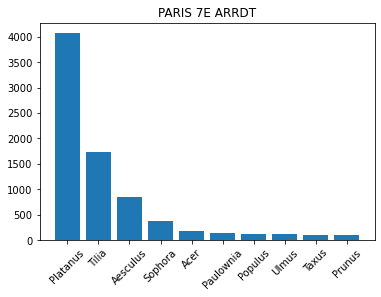

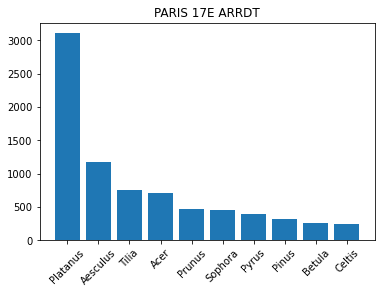

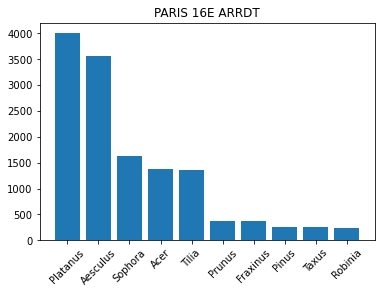

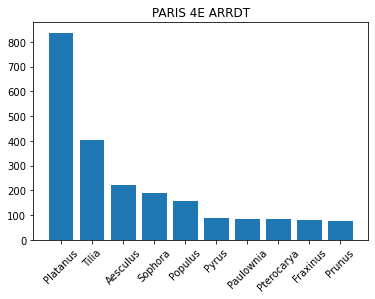

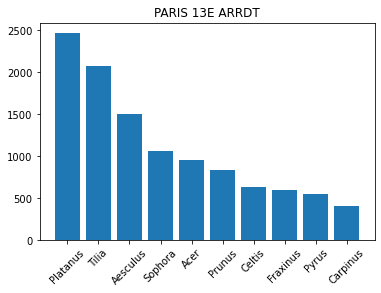

...

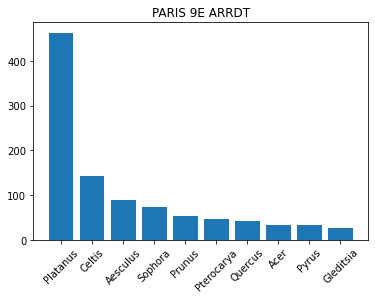

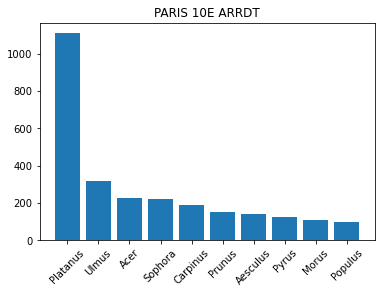

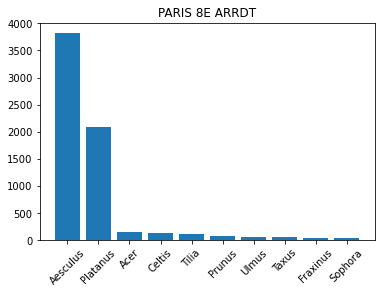

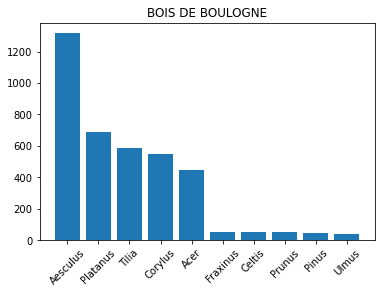

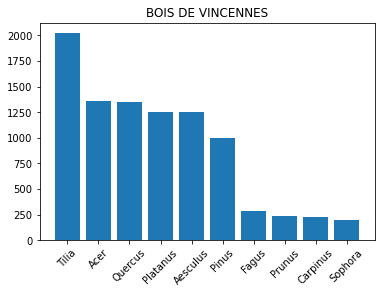

In [16]:
for i in df.groupby(pd.Grouper('arrondissement')):
#     print(i[0])
    df_top = i[1].groupby('genre').size().nlargest(10)
    plt.bar(df_top.index,df_top.values)
    plt.title(i[0])
    plt.xticks(rotation=45)
    plt.show()

#     if k < 24:
#         k += 1
#         ax = fig.add_subplot(24,1,k)
#         ax.bar(df_top.index,df_top.values)
#         ax.set_title(i[0])
#         print('')

In [17]:
df_scat_dom = df[['id','domanialite','genre','hauteur_m','geo_point_2d_a','geo_point_2d_b','circonference_cm','stade_developpement']]
df_scat_dom = df_scat_dom.dropna()
# df_scat_dom['espece']=df[df['id']==df_scat_dom['id']].espece
# df[df_scat_dom].dropna().info()
df.info()
# i[1].groupby('genre').size().nlargest(10).values

<class 'pandas.core.frame.DataFrame'>
Int64Index: 199584 entries, 0 to 200136
Data columns (total 18 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   id                   199584 non-null  int64  
 1   type_emplacement     199584 non-null  object 
 2   domanialite          199583 non-null  object 
 3   arrondissement       199584 non-null  object 
 4   complement_addresse  30808 non-null   object 
 5   numero               0 non-null       float64
 6   lieu                 199584 non-null  object 
 7   id_emplacement       199584 non-null  object 
 8   libelle_francais     198088 non-null  object 
 9   genre                199568 non-null  object 
 10  espece               197833 non-null  object 
 11  variete              36733 non-null   object 
 12  circonference_cm     199584 non-null  int64  
 13  hauteur_m            199584 non-null  int64  
 14  stade_developpement  132389 non-null  object 
 15  remarquable      

In [18]:
px.set_mapbox_access_token("pk.eyJ1IjoicC1tYXR0IiwiYSI6ImNrdXA5ZDN0aDE2MGYyb3AxcmQ2NnJ0b3MifQ.A1l79VIwZtN9hyfDgs930Q") 
fig2 = px.scatter_mapbox(df_scat_dom[df_scat_dom['domanialite']=='Jardin'], lat="geo_point_2d_a", lon="geo_point_2d_b", mapbox_style='satellite', color="genre", hover_name="genre", zoom=11, height=700) 
fig2.update_traces(marker=dict(size=4))

In [19]:
px.set_mapbox_access_token("pk.eyJ1IjoicC1tYXR0IiwiYSI6ImNrdXA5ZDN0aDE2MGYyb3AxcmQ2NnJ0b3MifQ.A1l79VIwZtN9hyfDgs930Q") 
fig2 = px.scatter_mapbox(df_scat_dom[df_scat_dom['domanialite']=='Jardin'].loc[(df_scat_dom['genre']=='Platanus')|(df_scat_dom['genre']=='Tilia')], lat="geo_point_2d_a", lon="geo_point_2d_b", mapbox_style='satellite', color="genre", hover_name="stade_developpement", zoom=11, height=700) 
fig2.update_traces(marker=dict(size=4))

In [33]:
# px.set_mapbox_access_token("pk.eyJ1IjoicC1tYXR0IiwiYSI6ImNrdXA5ZDN0aDE2MGYyb3AxcmQ2NnJ0b3MifQ.A1l79VIwZtN9hyfDgs930Q") 
fig2 = px.scatter_mapbox(df_scat_dom[df_scat_dom['genre']=='Platanus'], lat="geo_point_2d_a", lon="geo_point_2d_b", mapbox_style="streets", color="stade_developpement", hover_name="genre", zoom=11, height=700) 
fig2.update_traces(marker=dict(size=10), text='hauteur_m')

In [87]:
fig2 = px.scatter_mapbox(df_scat_dom, lat="geo_point_2d_a", lon="geo_point_2d_b", mapbox_style="streets", color="domanialite", hover_name="genre", zoom=11, height=700) 
fig2.update_traces(marker=dict(size=df_chauteur_m))

ValueError: 
    Invalid value of type 'builtins.str' received for the 'size' property of scattermapbox.marker
        Received value: 'hauteur_m'

    The 'size' property is a number and may be specified as:
      - An int or float in the interval [0, inf]
      - A tuple, list, or one-dimensional numpy array of the above

In [21]:
df_scat_dom[df_scat_dom['domanialite']=='Jardin'].loc[(df_scat_dom['genre']=='Platanus')|(df_scat_dom['genre']=='Tilia')]

,id,domanialite,genre,hauteur_m,geo_point_2d_a,geo_point_2d_b,circonference_cm,stade_developpement
150,100032,Jardin,Tilia,10,48.821805,2.376479,190,M
151,100033,Jardin,Tilia,10,48.821857,2.376449,140,A
152,100034,Jardin,Tilia,10,48.821815,2.376292,125,A
321,100371,Jardin,Tilia,10,48.837293,2.378225,60,A
322,100372,Jardin,Tilia,10,48.837335,2.378173,65,A
...,...,...,...,...,...,...,...,...
197037,2020688,Jardin,Platanus,7,48.898656,2.360347,50,J
197209,2020881,Jardin,Tilia,16,48.849365,2.413914,170,M
198320,2022304,Jardin,Tilia,4,48.821353,2.335442,34,JA
198340,2022325,Jardin,Tilia,14,48.820981,2.339228,109,A


<AxesSubplot:xlabel='geo_point_2d_a', ylabel='geo_point_2d_b'>

C:\Users\Lenovo\Anaconda3\envs\DataVis\lib\site-packages\IPython\core\pylabtools.py:132: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.



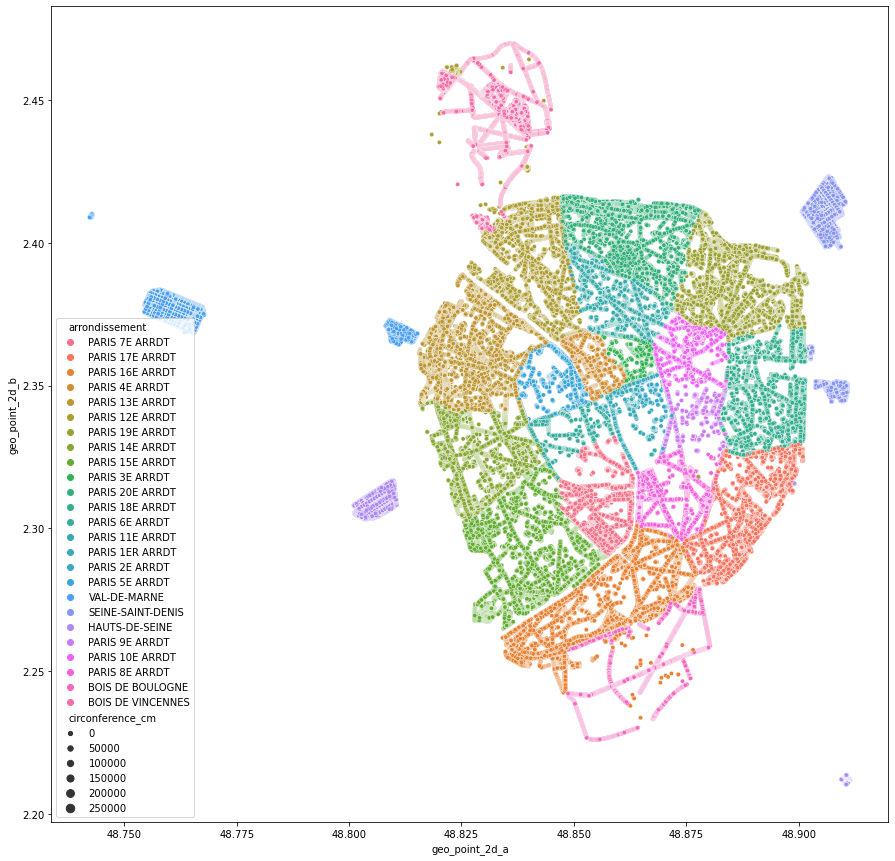

In [22]:
f, ax = plt.subplots(figsize=(15, 15))
sns.scatterplot(x="geo_point_2d_a", y="geo_point_2d_b",
                hue="arrondissement",size = 'circonference_cm',
#                 palette="ch:r=-.2,d=.3_r",
#                 hue_order=clarity_ranking,
#                 sizes=(5, 15), linewidth=1,
                data=data_trees[data_trees['hauteur_m']<1000], ax= ax)

<AxesSubplot:xlabel='geo_point_2d_a', ylabel='geo_point_2d_b'>

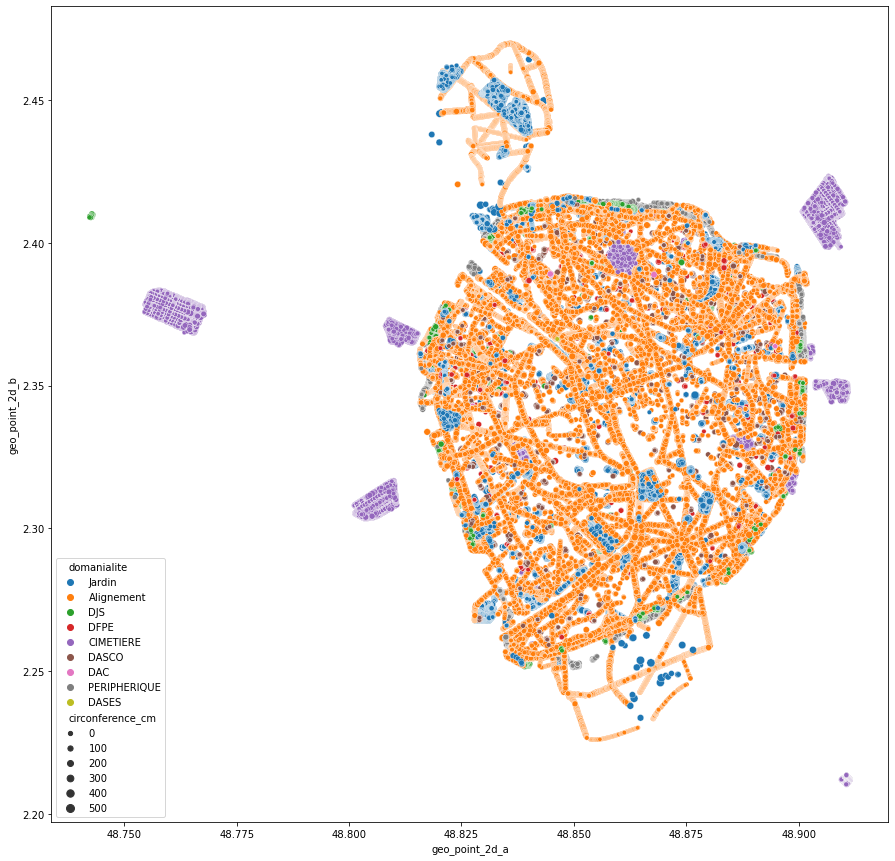

In [23]:
df_plat = data_trees[data_trees['genre'] == 'Platanus']
f, ax = plt.subplots(figsize=(15, 15))
sns.scatterplot(x="geo_point_2d_a", y="geo_point_2d_b",
                hue="domanialite",size = 'circonference_cm',
#                 palette="ch:r=-.2,d=.3_r",
#                 hue_order=clarity_ranking,
#                 sizes=(5, 15), linewidth=1,
                data=df)

In [83]:
df_pie = df[df['domanialite']=='Jardin'].groupby('genre').count()
data = np.concatenate((np.reshape(df_pie.index,(len(df_pie),1)), np.reshape(df_pie.values[:,0],(len(df_pie),1))),axis=1)
data
# data.sort(axis=0)
# data
fig = px.pie(data, values=data[:,1], names=data[:,0])
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()
# plt.pie(data[:,1],labels=data[:,0], rotatelabels=True, autopct='%.2f')

In [24]:
data_trees[data_trees['domanialite']=='Jardin'].iloc[:200]

,id,type_emplacement,domanialite,arrondissement,complement_addresse,numero,lieu,id_emplacement,libelle_francais,genre,espece,variete,circonference_cm,hauteur_m,stade_developpement,remarquable,geo_point_2d_a,geo_point_2d_b
0,99874,Arbre,Jardin,PARIS 7E ARRDT,NaN,NaN,MAIRIE DU 7E 116 RUE DE GRENELLE PARIS 7E,19,Marronnier,Aesculus,hippocastanum,NaN,20,5,NaN,0.0,48.857620,2.320962
1,99875,Arbre,Jardin,PARIS 7E ARRDT,NaN,NaN,MAIRIE DU 7E 116 RUE DE GRENELLE PARIS 7E,20,If,Taxus,baccata,NaN,65,8,A,NaN,48.857656,2.321031
2,99876,Arbre,Jardin,PARIS 7E ARRDT,NaN,NaN,MAIRIE DU 7E 116 RUE DE GRENELLE PARIS 7E,21,If,Taxus,baccata,NaN,90,10,A,NaN,48.857705,2.321061
3,99877,Arbre,Jardin,PARIS 7E ARRDT,NaN,NaN,MAIRIE DU 7E 116 RUE DE GRENELLE PARIS 7E,22,Erable,Acer,negundo,NaN,60,8,A,NaN,48.857722,2.321006
4,99878,Arbre,Jardin,PARIS 17E ARRDT,NaN,NaN,PARC CLICHY-BATIGNOLLES-MARTIN LUTHER KING,000G0037,Arbre à miel,Tetradium,daniellii,NaN,38,0,NaN,NaN,48.890435,2.315289
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195,100239,Arbre,Jardin,PARIS 19E ARRDT,NaN,NaN,PARC DES BUTTES CHAUMONT,C0180041,Erable,Acer,pseudoplatanus,NaN,145,0,NaN,NaN,48.879846,2.386575
196,100240,Arbre,Jardin,PARIS 19E ARRDT,NaN,NaN,PARC DES BUTTES CHAUMONT,C0180042,Erable,Acer,pseudoplatanus,NaN,225,18,NaN,NaN,48.879878,2.386526
197,100241,Arbre,Jardin,PARIS 19E ARRDT,NaN,NaN,PARC DES BUTTES CHAUMONT,P1080003,Robinier,Robinia,pseudoacacia,NaN,40,7,NaN,NaN,48.876271,2.380824
198,100242,Arbre,Jardin,PARIS 19E ARRDT,NaN,NaN,PARC DES BUTTES CHAUMONT,P1080013,Sophora,Sophora,japonica,NaN,70,12,NaN,NaN,48.876454,2.380269


domanialite
arrondissement
libelle_francais
genre


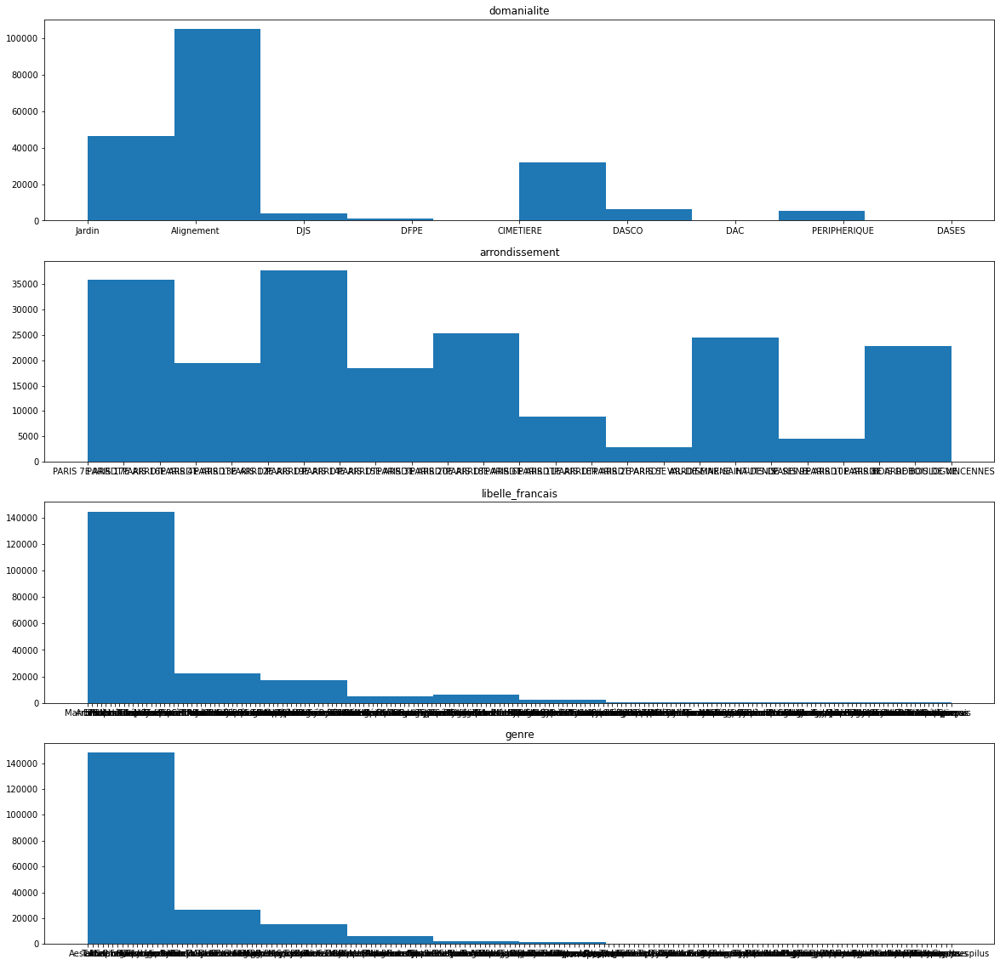

In [25]:
k = 0
fig = plt.figure(figsize=(20, 20))

for i in data_trees_obj[['domanialite','arrondissement','libelle_francais','genre']]:
    if k < 4:
        k += 1
        ax = fig.add_subplot(4,1,k)
        print(i)
        ax.hist(data_trees_obj[i].dropna())
        ax.set_title(i)